Suivit du tuto : 

https://www.youtube.com/watch?v=sttf-Rgfl1Q

In [1]:
import os, sys, time
import numpy as np
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split
from sklearn.metrics import accuracy_score
# from sklearn.utils import shuffle

import mne
from mne.channels import make_standard_montage
from mne.io import concatenate_raws, read_raw_edf
from mne.datasets import eegbci
from mne.decoding import CSP

from mne.preprocessing import ICA, corrmap
# from mne.viz import plot_events, plot_montage

import joblib

In [3]:

experiments = [
    {
        "description": "open and close left or right fist",
        "runs": [3, 7, 11],
        "mapping": {0: "rest", 1: "left fist", 2: "right fist"},
    },
    {
        "description": "imagine opening and closing left or right fist",
        "runs": [4, 8, 12],
        "mapping": {0: "rest", 1: "imagine left fist", 2: "imagine right fist"},
    },
    {
        "description": "open and close both fists or both feet",
        "runs": [5, 9, 13],
        "mapping": {0: "rest", 1: "both fists", 2: "both feets"},
    },
    {
        "description": "imagine opening and closing both fists or both feet",
        "runs": [6, 10, 14],
        "mapping": {0: "rest", 1: "imagine both fists", 2: "imagine both feets"},
    },
    {
        "description": "movement (real or imagine) of fists",
        "runs": [3, 7, 11, 4, 8, 12],
        "mapping": {0: "rest", 1: "left fist", 2: "right fist"},
    },
    {
        "description": "movement (real or imagine) of both fists or both feet",
        "runs": [5, 9, 13, 6, 10, 14],
        "mapping": {0: "rest", 1: "both fists", 2: "both feets"},
    },
]

In [4]:
path = os.getenv('HOME') + '/sgoinfre'

exp_set = 0
subject_nb = 1
experiment = experiments[exp_set]
raw_fnames = eegbci.load_data(subject_nb, experiment["runs"])
raw = concatenate_raws([read_raw_edf(f, preload=True) for f in raw_fnames])
sfreq = raw.info['sfreq']

Extracting EDF parameters from /mnt/nfs/homes/clorin/sgoinfre/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /mnt/nfs/homes/clorin/sgoinfre/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /mnt/nfs/homes/clorin/sgoinfre/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


Using matplotlib as 2D backend.


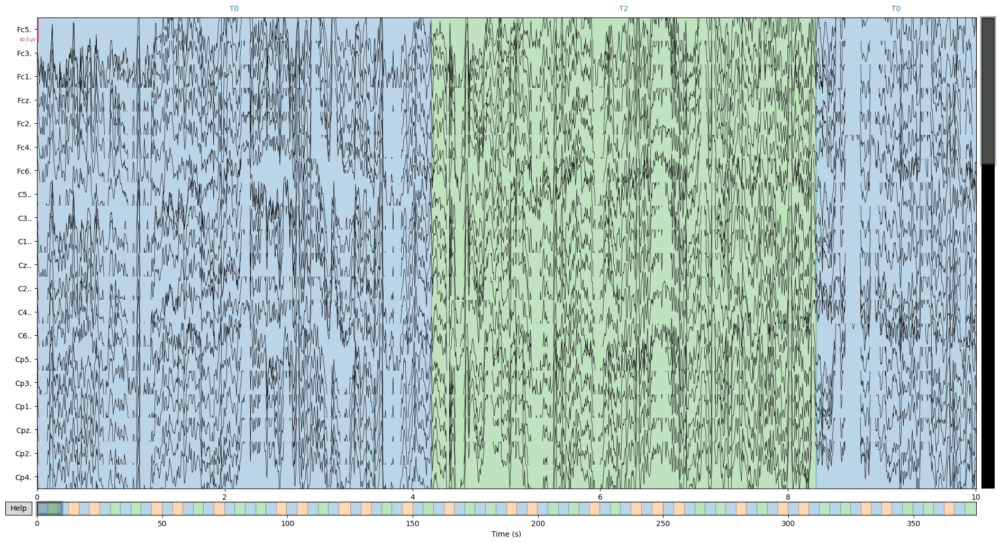

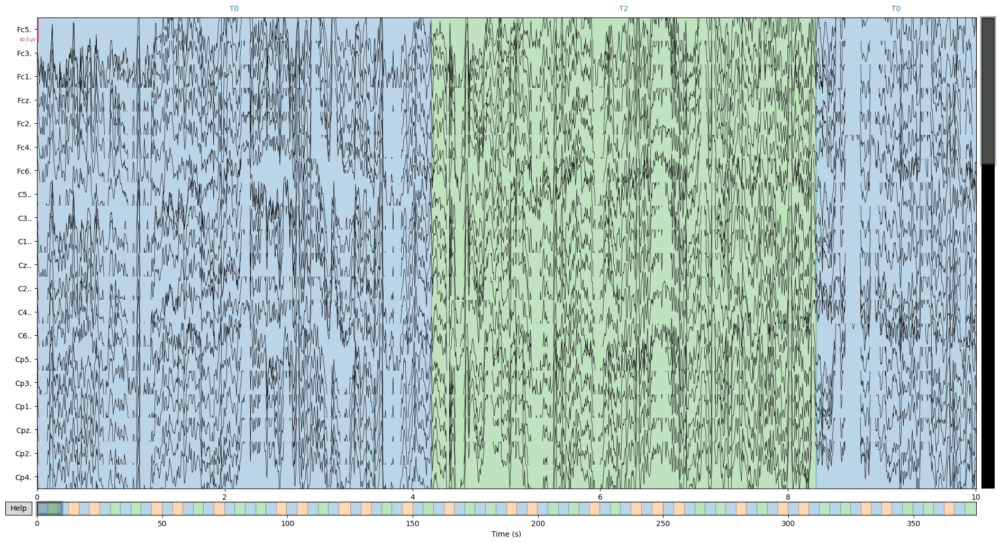

In [5]:
raw.plot()

In [6]:
events, event_id = mne.events_from_annotations(raw, event_id=dict(T1=1, T2=2))
annotations = mne.annotations_from_events(events=events, sfreq=sfreq, event_desc={0: "rest", 1: "left fist", 2:"right fist"}, verbose=True)
# raw = raw.set_annotations(annotations=annotations)
raw.filter(7.0, 30.0, fir_design="firwin", skip_by_annotation="edge")
# raw.filter(7.0, 30.0)
mne.datasets.eegbci.standardize(raw=raw)
# Montage
montage = mne.channels.make_standard_montage("biosemi64")
raw.set_montage(montage, on_missing='ignore')

Used Annotations descriptions: ['T1', 'T2']
Filtering raw data in 3 contiguous segments
Setting up band-pass filter from 7 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 7.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 6.00 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 265 samples (1.656 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    0.0s finished


<RawEDF | S001R03.edf, 64 x 60000 (375.0 s), ~29.4 MB, data loaded>

In [7]:
ica = ICA(n_components=20, random_state=0)
raw.drop_channels(['T9', 'T10'], on_missing='ignore')
ica.fit(raw.copy())

Fitting ICA to data using 62 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 2.0s.


Method,fastica
Fit,67 iterations on raw data (60000 samples)
ICA components,20
Available PCA components,62
Channel types,eeg
ICA components marked for exclusion,—


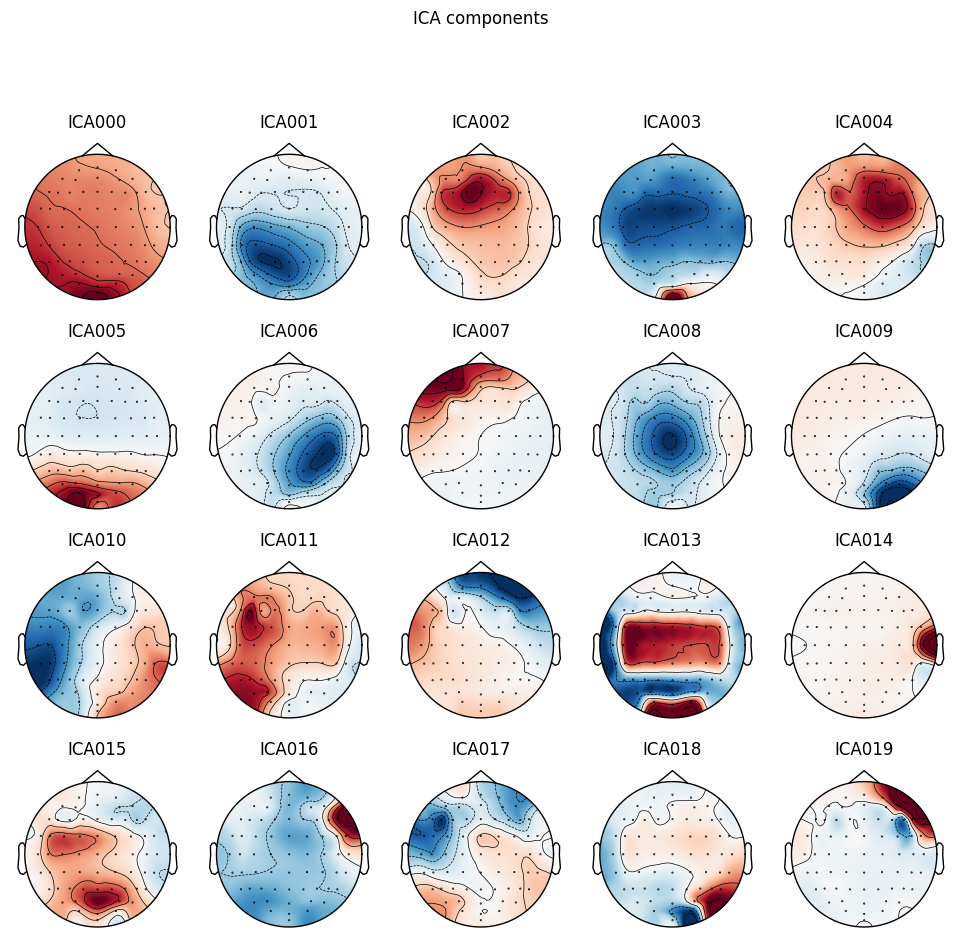

[<MNEFigure size 975x967 with 20 Axes>]

In [8]:
ica.plot_components(outlines='head', inst=raw)

In [9]:
ica.exclude=[7,15,18,19]
channels = raw.info["ch_names"]
l = set()
for channel in channels:
    bad_idx, scores = ica.find_bads_eog(raw, ch_name=channel, threshold=5, verbose=False)
    # print(f"{channel} => {bad_idx}")
    l.add(channel)

exclude = list(l)
print(exclude)

['P1', 'FC6', 'CPz', 'F3', 'Pz', 'P4', 'P6', 'FT7', 'FC3', 'Fpz', 'CP3', 'PO3', 'Oz', 'T8', 'O1', 'CP1', 'Fp1', 'PO8', 'F1', 'F8', 'FC4', 'CP5', 'P3', 'O2', 'TP7', 'Fp2', 'FC5', 'CP6', 'P8', 'FC1', 'CP4', 'F5', 'PO4', 'F7', 'T7', 'TP8', 'Fz', 'F4', 'C1', 'F6', 'P7', 'P2', 'AFz', 'AF4', 'F2', 'P5', 'C2', 'C6', 'PO7', 'AF8', 'CP2', 'Cz', 'AF7', 'Iz', 'C3', 'AF3', 'FC2', 'FT8', 'C4', 'C5', 'POz', 'FCz']


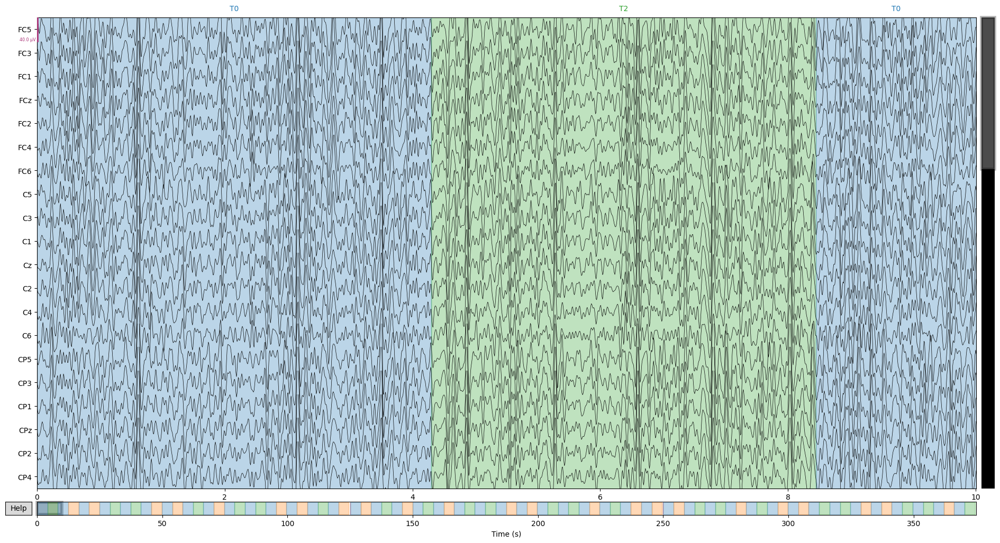

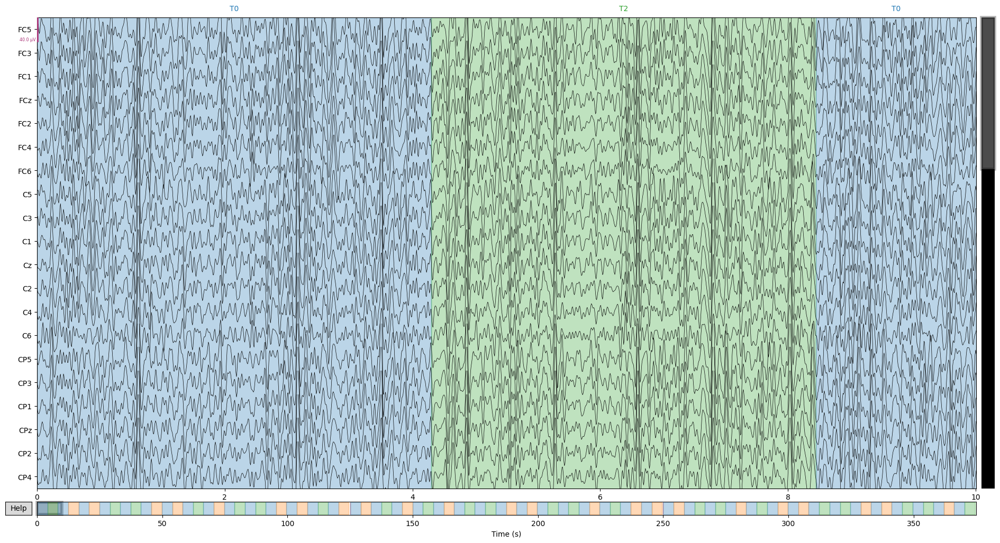

In [10]:
raw.plot()

In [11]:
ica.apply(raw.copy(), exclude=ica.exclude)

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components


<RawEDF | S001R03.edf, 62 x 60000 (375.0 s), ~28.5 MB, data loaded>

In [12]:
events, event_id = mne.events_from_annotations(raw, event_id=dict(T0=0, T1=1, T2=2))

Used Annotations descriptions: ['T0', 'T1', 'T2']


In [13]:
picks = mne.pick_types(raw.info, meg=False, eeg=True, stim=False, eog=False)
epochs = mne.Epochs(raw, events, event_id, -0.2, 0.5, proj=True, picks=picks, baseline=None, preload=True, verbose=50)
    

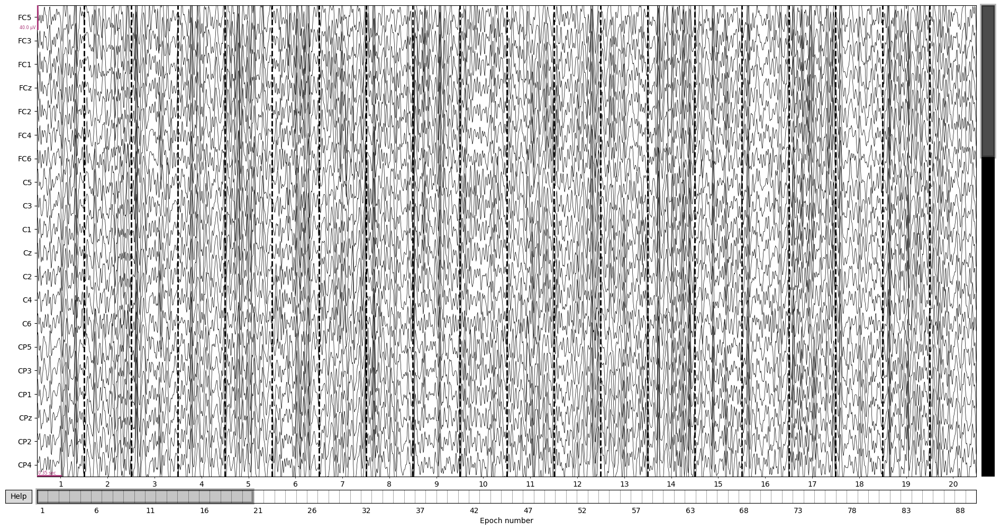

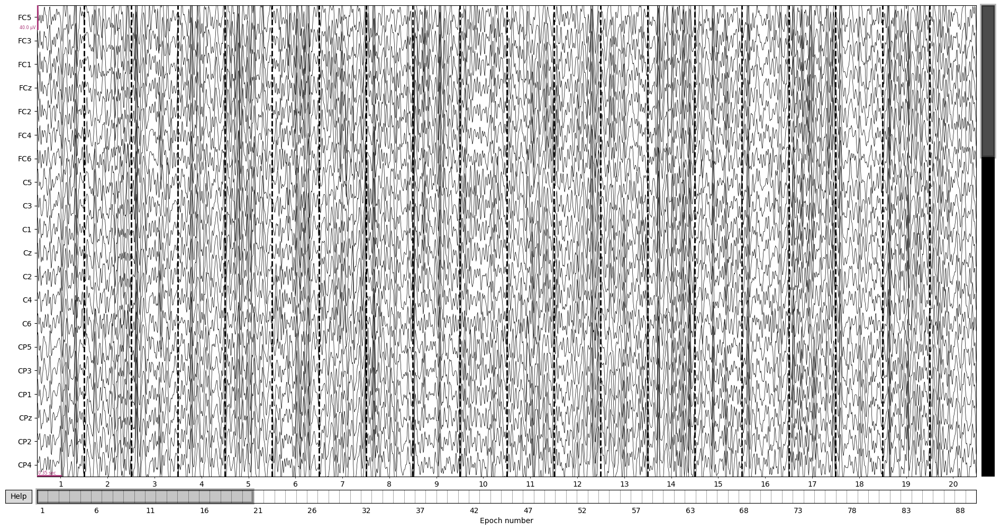

In [14]:
epochs.plot()

In [15]:
epochs = ica.apply(epochs, exclude=ica.exclude)

Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components


In [16]:
epochs.apply_baseline((None, 0))

Applying baseline correction (mode: mean)


Number of events,87
Events,T0: 42T1: 23T2: 22
Time range,-0.200 – 0.500 sec
Baseline,-0.200 – 0.000 sec


Not setting metadata
23 matching events found
No baseline correction applied
0 projection items activated


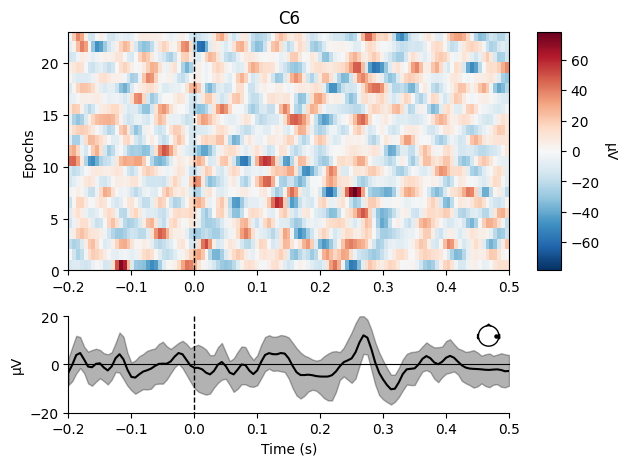

[<Figure size 640x480 with 4 Axes>]

In [17]:
epochs['T1'].plot_image(picks=[13])

In [18]:
epochs.equalize_event_counts(event_id)

Dropped 21 epochs: 3, 5, 11, 13, 17, 23, 24, 25, 30, 34, 38, 44, 46, 52, 56, 59, 65, 69, 71, 77, 79


(<Epochs |  66 events (all good), -0.2 - 0.5 sec, baseline -0.2 – 0 sec, ~3.6 MB, data loaded,
  'T0': 22
  'T1': 22
  'T2': 22>,
 array([ 3,  5, 11, 13, 17, 23, 25, 30, 34, 38, 44, 46, 52, 56, 59, 65, 69,
        71, 77, 79, 24]))

In [19]:
# epochs['T1'].plot_image(picks=[13])

In [ ]:
epochs.info

In [ ]:
epochs.save("essais3-epo.fif", overwrite=True)

In [ ]:
T0 = epochs["T0"].average()
T1 = epochs["T1"].average()
T2 = epochs["T2"].average()


In [ ]:
mne.viz.plot_compare_evokeds({"T0":T0, "T2": T2}, picks=[0])

In [ ]:
# diff = mne.combine_evoked((T1, T0), weights='equal')
# diff.plot_joint(times=[0.1,0.2,0.3,0.4,0.5])

In [ ]:
raw.save("essais1.raw.fif", overwrite=True)

In [ ]:
raw=mne.io.read_raw_fif("essais1.raw.fif")

In [ ]:
events, event_id = mne.events_from_annotations(raw)
picks = mne.pick_types(raw.info, meg=False, eeg=True, stim=False, eog=False, exclude="bads")
epochs = mne.Epochs(raw, events, event_id, -1, 4, proj=True, picks=picks, baseline=None, preload=True)
labels = epochs.events[:, -1]
# print(labels)
epochs_train = epochs.copy().crop(tmin=1.0, tmax=4.0).get_data()
print(epochs_train.shape)

In [ ]:
csp = mne.decoding.CSP(6)
lda = LinearDiscriminantAnalysis()
clf = Pipeline([("CSP", csp), ("LDA", lda)])

In [ ]:

# fit our pipeline to the experiment
X_train, X_test, y_train, y_test = train_test_split(epochs_train, labels,train_size=0.8, random_state=42)
clf.fit(X_train, y_train)
cvs = cross_val_score(clf, X_train, y_train)
mean_cvs = np.mean(cvs)
print(f"mean of Cross_Val_Score =  = {mean_cvs}")

In [ ]:
predictions = clf.predict(X_test)
print(f'epoch nb: [prediction] [truth] equal?')
for i, prediction in enumerate(predictions):
    print(f'epoch {i:02d}: [{prediction}] [{y_test[i]}] {prediction == y_test[i]}')
    time.sleep(0.05)

score_subject = accuracy_score(predictions, y_test)
print(f'mean accuracy for all experiments:{score_subject}')